In [1]:
import os
import json
# @param ["tensorflow", "jax", "torch"]<
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
os.environ['KERAS_BACKEND'] = 'tensorflow'  
os.environ['TF_XLA_FLAGS']='--tf_xla_auto_jit=1,--tf_xla_always_defer_compilation=true'
os.environ['XLA_FLAGS']='--xla_backend_optimization_level=0,--xla_gpu_autotune_level=4,--xla_gpu_disable_ptxas_optimizations=true,--xla_gpu_use_cudnn_batchnorm_level=2'
os.environ['TF_GPU_ALLOCATOR']='cuda_malloc_async'
os.environ['TF_CPP_MIN_LOG_LEVEL']='5'

In [2]:
import keras
from keras import layers
import keras_cv

import os
import numpy as np
from glob import glob
import cv2
from scipy.io import loadmat
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from PIL import ImageColor

%matplotlib inline

# For data preprocessing
from tensorflow import image as tf_image
from tensorflow import data as tf_data
from tensorflow import io as tf_io
import tensorflow as tf
import pandas as pd
import numpy as np

warnings.filterwarnings(action="ignore")

plt.style.use('seaborn-v0_8-darkgrid')
sns.set(font_scale=1);
warnings.filterwarnings(action="ignore")

tf.get_logger().setLevel('ERROR')# Suppress TensorFlow logging (2)

In [3]:
print("Tensorflow\t : %s\tCUDA %s\tGPU %s\tXLA %s\nKeras\t\t : %s\nKerasCV\t\t : %s\nPandas\t\t : %s\nNumPy\t\t : %s"%
      (tf.__version__, 
       tf.test.is_built_with_cuda(), 
       tf.test.is_built_with_gpu_support(), 
       tf.test.is_built_with_xla(), 
       keras.__version__, 
       keras_cv.__version__ , 
       pd.__version__, 
       np.__version__))

Tensorflow	 : 2.16.1	CUDA False	GPU False	XLA True
Keras		 : 3.1.1
KerasCV		 : 0.8.2
Pandas		 : 1.4.1
NumPy		 : 1.24.4


In [16]:
repertoireEnregistrement="/home/jovyan/sauvegarde_images"
def sauvegarderImage(filename,repertoireEnregistrement=repertoireEnregistrement):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    plt.savefig(os.path.join(repertoireEnregistrement,filename+'.png'), dpi=600, bbox_inches='tight')

def sauvegarderImageSNS(sns_plot, filename, repertoireEnregistrement=repertoireEnregistrement):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    fig = sns_plot.get_figure()
    fig.savefig(os.path.join(repertoireEnregistrement,filename+'.png'))      
    

In [ ]:
palette = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973",
            "#f5054f", 
            "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", "#d1e5f0", "#fddbc7",
            "#ffffcb", "#12e193", "#d8dcd6", "#ffdaf0", "#dfc5fe", "#f5054f", "#a0450e",
            "#0339f8", "#f4320c", "#fec615", "#017a79", "#85a3b2", "#fe2f4a", "#a00498", "#b04e0f",
            "#0165fc", "#ff724c", "#fddc5c", "#11875d", "#89a0b0", "#fe828c", "#cb00f5", "#b75203",
            "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#ffb7ce", "#c071fe", "#ca6b02",
            "#92c5de", "#f4a582", "#fef69e", "#18d17b", "#c5c9c7", "#ffcfdc", "#caa0ff", "#cb7723",
            "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#ffdaf0", "#dfc5fe", "#d8863b",
            "#030764", "#be0119", "#dbb40c", "#005249", "#3c4142", "#cb0162", "#5d1451", "#653700",
            "#040348", "#67001f", "#b27a01", "#002d04", "#000000", "#a0025c", "#490648", "#3c0008"
          ]

In [4]:
palette = ['#000000','#8ffe09','#bd6c48','#54ac68','#21c36f','#070d0d','#feb308','#9b5fc0','#6ecb3c','#76cd26','#ffb16d','#13eac9','#02d8e9','#12e193','#2ee8bb','#04d8b2','#4b5d16','#77ab56','#3d0734','#9a3001','#90b134','#87a922','#1d5dec','#069af3','#a2cffe','#8cff9e','#ffb7ce','#ab9004','#937c00','#8f9805','#b6c406','#ca9bf7','#ad900d','#889717','#ffff7e','#fafe4b','#fe46a5','#94ac02','#ac1db8','#a00498','#6b7c85','#e6daa6','#990f4b','#b5c306','#000000','#afa88b','#770001','#fe4b03','#980002','#0343df','#2242c7','#137e6d','#607c8e','#5729ce','#5d06e9','#533cc6','#0f9b8e','#758da3','#5a06ef','#464196','#017a79','#85a3b2','#2bb179','#89a0b0','#6241c7','#2976bb','#10a674','#748b97','#703be7','#5539cc','#f29e8e','#fe828c','#9bb53c','#96b403','#7b002c','#63b365','#044a05','#a03623','#c14a09','#8f1402','#0bf9ea','#0165fc','#41fdfe','#01ff07','#c760ff','#26f7fd','#2dfe54','#c95efb','#87fd05','#65fe08','#ff08e8','#9cbb04','#ff5b00','#fe01b1','#be03fd','#ff000d','#05ffa6','#02ccfe','#01f9c6','#0ffef9','#ad0afd','#fffd01','#9dff00','#05480d']
palette = [ImageColor.getcolor(c, "RGB") for c in palette]

In [5]:
chkp_call_loss = keras.callbacks.ModelCheckpoint(
        'checkpoint.weights.h5',
        monitor="loss",
        save_best_only=True,
        save_weights_only=True,
        mode="auto",
    )

chkp_call_accuracy = keras.callbacks.ModelCheckpoint(
        'checkpoint.weights.h5',
        monitor="accuracy",
        save_best_only=True,
        save_weights_only=True,
        mode="auto",
    )

chkp_call_val_loss = keras.callbacks.ModelCheckpoint(
        'checkpoint.weights.h5',
        monitor="val_loss",
        save_best_only=True,
        save_weights_only=True,
        mode="auto",
    )

chkp_call_val_accuracy = keras.callbacks.ModelCheckpoint(
        'checkpoint.weights.h5',
        monitor="val_accuracy",
        save_best_only=True,
        save_weights_only=True,
        mode="auto",
    )

IMAGE_SIZE = 512
BATCH_SIZE = 2
NUM_CLASSES = 104

backbone = keras_cv.models.ResNet50V2Backbone(input_shape=[512, 512, 3])
model = keras_cv.models.segmentation.DeepLabV3Plus(
    num_classes=NUM_CLASSES, backbone=backbone,
)

model.compile(
    optimizer="adam",
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), #keras.losses.BinaryCrossentropy(from_logits=False),
    metrics=["accuracy"]
)

In [6]:
chkp_fichier = '/home/jovyan/model_sauvegarde/checkpoint.weights.h5'
if os.path.exists(chkp_fichier):
    if not os.path.isdir(chkp_fichier):
        model.load_weights(chkp_fichier)

In [7]:
IMAGE_SIZE = 512
def read_image(image_path, mask=False):
    image = tf_io.read_file(image_path)
    if mask:
        image = tf_image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf_image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    return image

def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions

In [8]:
image_tensor = read_image('/home/jovyan/images/00000269.jpg')
prediction_mask = infer(image_tensor=image_tensor, model=model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


In [46]:
donnees.head()

,no,label,label_no
0,1,candy,001 candy
1,2,egg tart,002 egg tart
2,3,french fries,003 french fries
3,4,chocolate,004 chocolate
4,5,biscuit,005 biscuit


In [49]:
donnees = pd.read_csv('/home/jovyan/donnees/category_id.txt',sep='\t')
donnees.columns=['no','label']
donnees['label_no'] = donnees.no.apply(lambda x :f'{x:03d} ')+donnees.label
colormap = [0]+list(donnees.no.sort_values().unique())
colormap = np.array(colormap).astype(np.uint8)

def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions

def decode_segmentation_masks(mask, colormap, n_classes):
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    for l in range(0, n_classes):
        idx = mask == l
        # r[idx] = colormap[l, 0]
        # g[idx] = colormap[l, 1]
        # b[idx] = colormap[l, 2]
        # r[idx] = palette[l][0]
        # g[idx] = palette[l][1]
        # b[idx] = palette[l][2]
        r[idx] = colormap[l]
        g[idx] = colormap[l]
        b[idx] = colormap[l]
    rgb = np.stack([r, g, b], axis=2)
    return rgb


def get_overlay(image, colored_mask):
    image = keras.utils.array_to_img(image)
    image = np.array(image).astype(np.uint8)
    overlay = cv2.addWeighted(image, 0.35, colored_mask, 0.65, 0)
    return overlay


def plot_samples_matplotlib(display_list, figsize=(5, 3),nom_image='dumy'):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(keras.utils.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
            
        keras.utils.array_to_img(display_list[i]).save(nom_image.replace('/images/','/sauvegarde_images/').replace('.jpg','')+f'{i:02d}'+'.png')
        axes[i].axis("off")   
    print(nom_image.split(os.sep)[-1])
    # sauvegarderImage(nom_image.split(os.sep)[-1].replace('.jpg',''))
    plt.show()
    
def initClasses(prediction_mask,donnees,nom_image='dumy'):
    d = donnees.merge(pd.Series(prediction_mask[1].ravel(),name='no'),on='no')
    d.sort_values('no').label_no.hist(figsize=(16,8), bins=d.no.sort_values().unique().size)
    plt.xticks(rotation='vertical')
    sauvegarderImage('plot'+nom_image.split(os.sep)[-1].replace('.jpg',''))
    plt.show()
    return d


def plot_predictions(images_list, colormap, model, n_classes):
    for image_file in images_list:
        image_tensor = read_image(image_file)
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, n_classes)
        overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, overlay, prediction_colormap], figsize=(36, 28),nom_image=image_file
        )
    return prediction_mask,prediction_colormap


train_images = sorted(glob("/home/jovyan/images/*"))

def read_image(image_path):
    image = tf_io.read_file(image_path)
    image = tf_image.decode_png(image, channels=3)
    image.set_shape([None, None, 3])
    image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    return image


def load_data(image_list):
    image = read_image(image_list)
    return image

def data_generator(image_list):
    dataset = tf_data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf_data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset


In [ ]:
prediction_mask = plot_predictions(train_images, colormap, model=model, n_classes=NUM_CLASSES)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
00006714.jpg


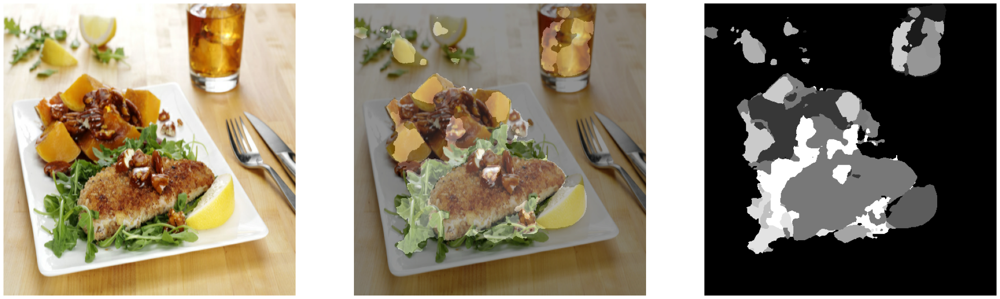

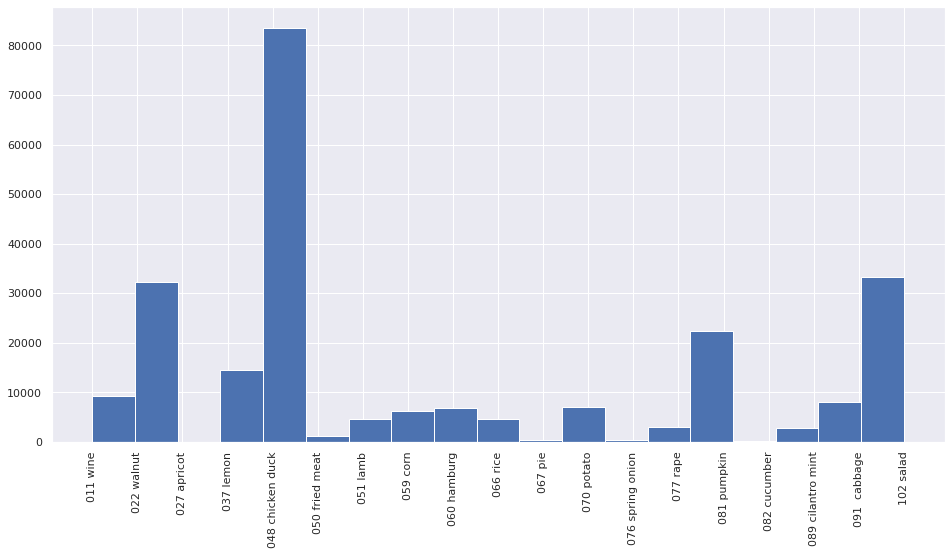

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
00000269.jpg


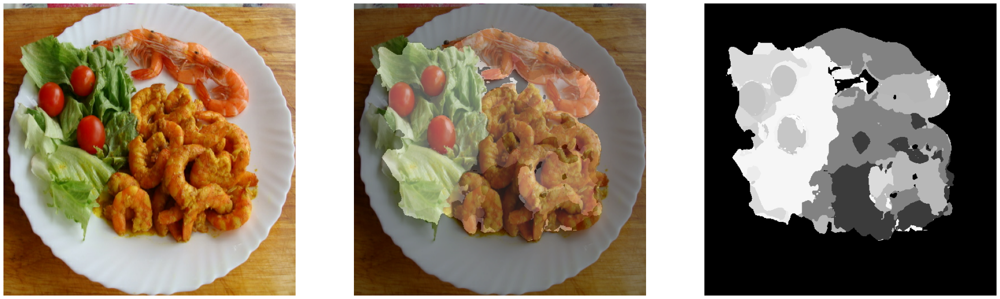

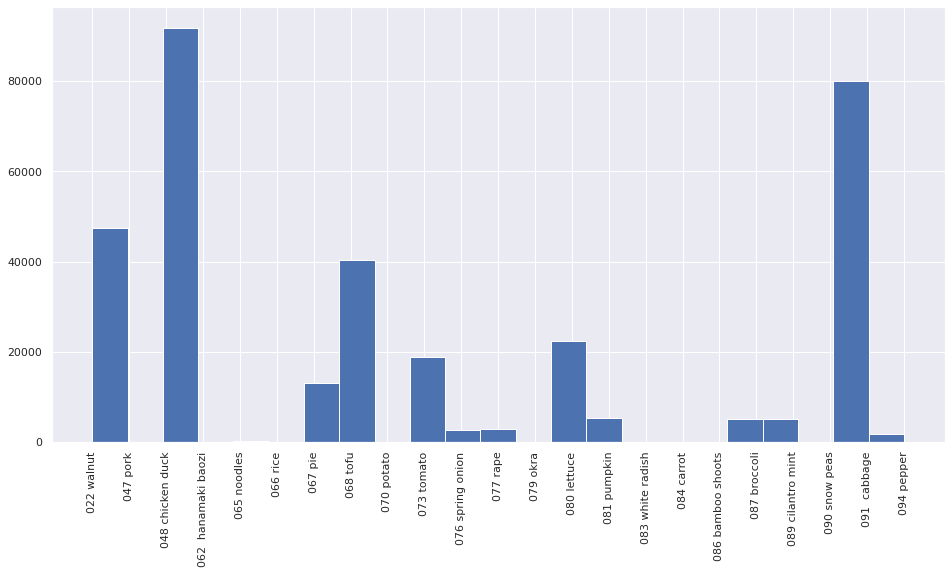

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
20240407_002319.jpg


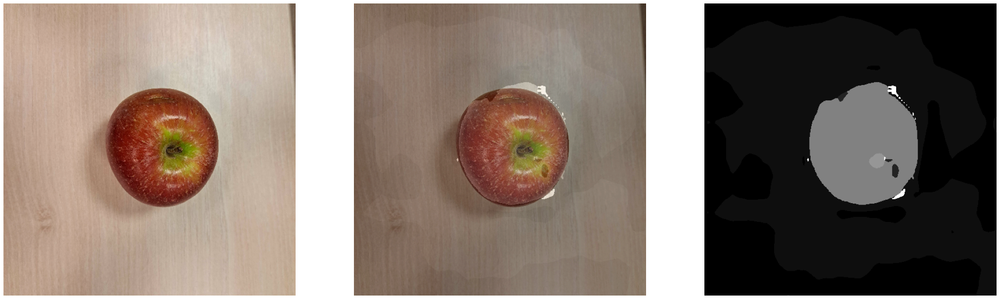

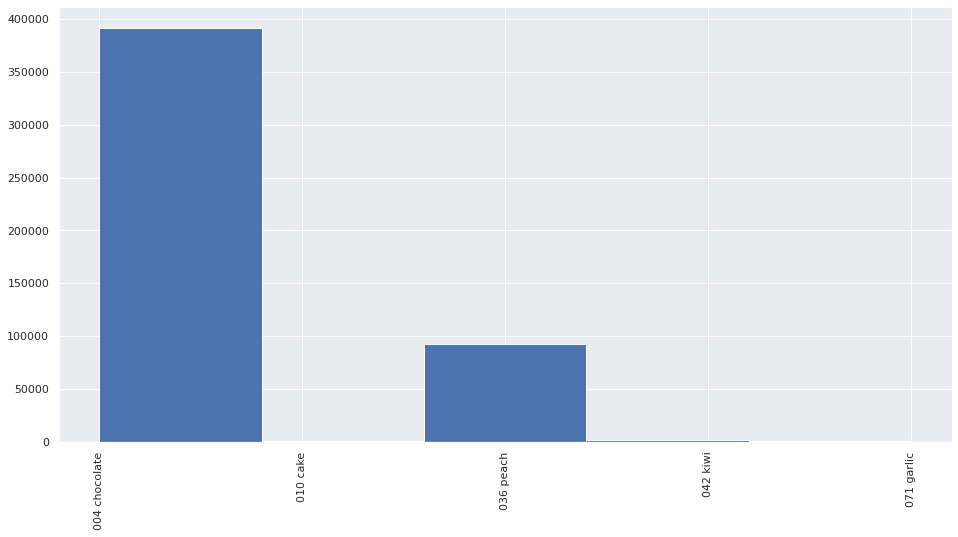

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
20240406_221313.jpg


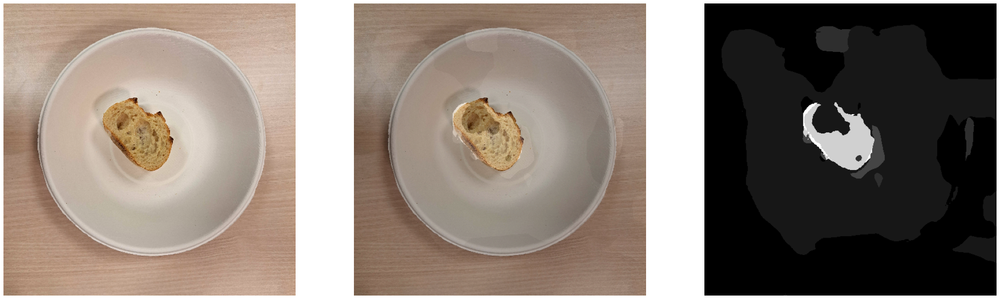

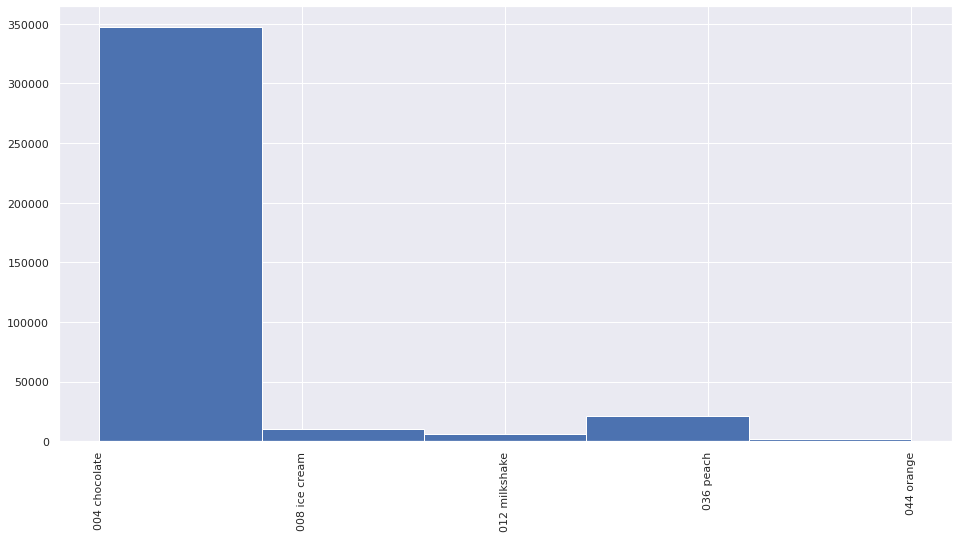

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
20240407_002528.jpg


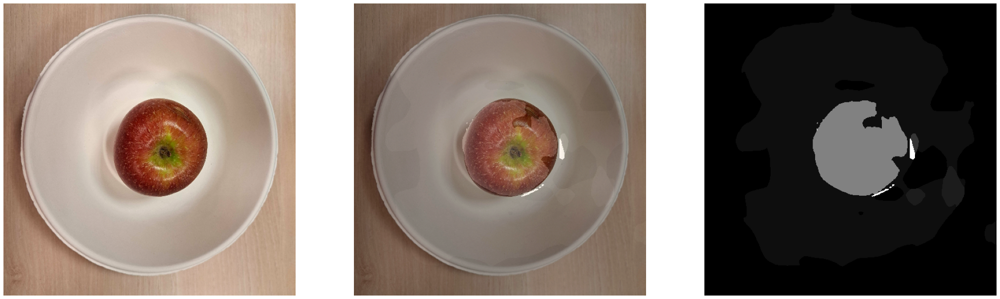

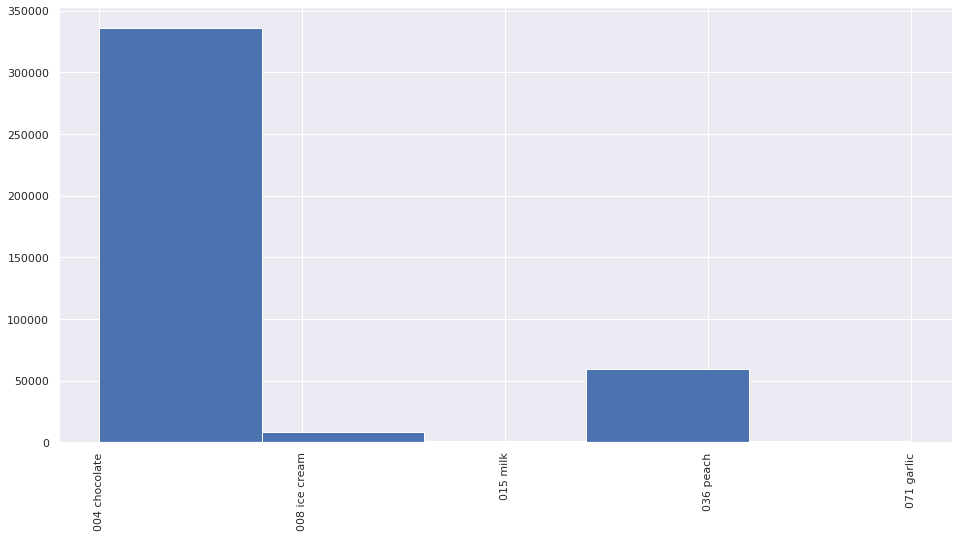

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
00000222.jpg


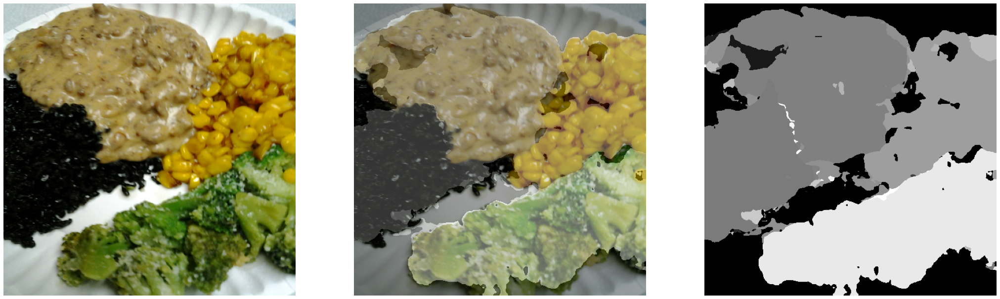

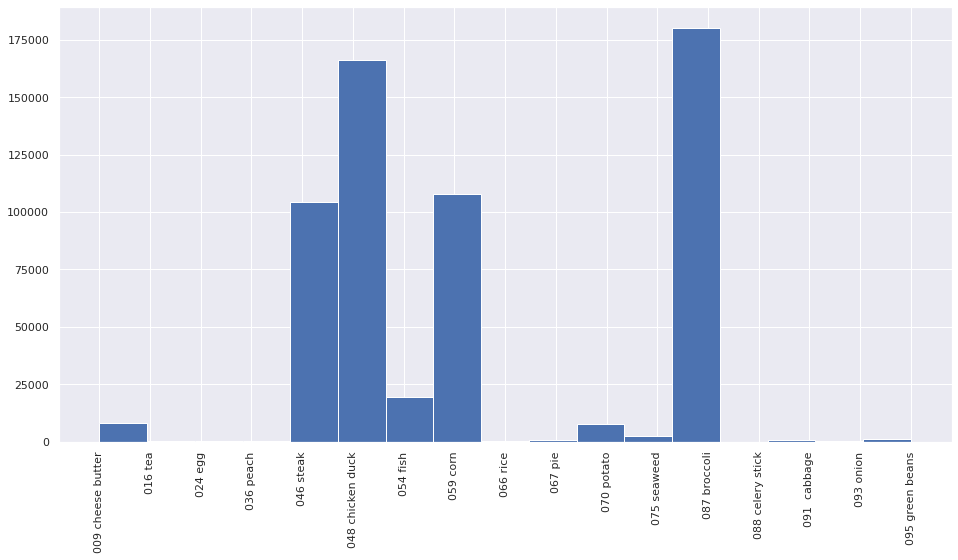

In [53]:
for fichier in os.listdir("/home/jovyan/images"):
    if fichier.find('jpg') > 0 : 
        train_images = sorted(glob("/home/jovyan/images"+os.sep+fichier))
        prediction_mask = plot_predictions(train_images, colormap, model=model, n_classes=NUM_CLASSES)
        d = initClasses(prediction_mask,donnees,fichier)

In [14]:
os.listdir("/home/jovyan/images")

['00006714.jpg',
 '.ipynb_checkpoints',
 '00000269.jpg',
 '20240407_002319.jpg',
 '20240406_221313.jpg',
 '20240407_002528.jpg',
 '00000222.jpg']

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
00000269.jpg


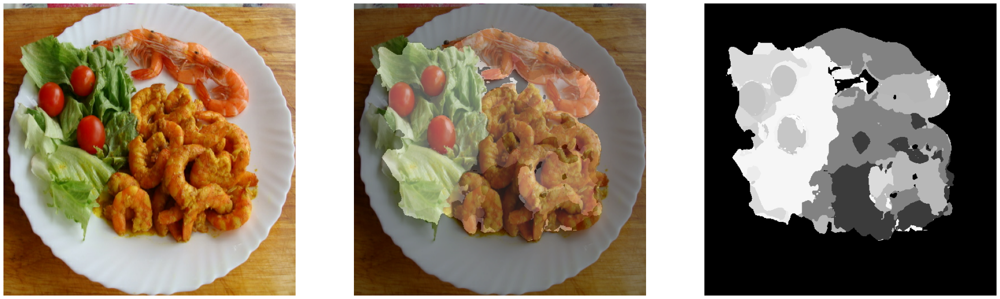

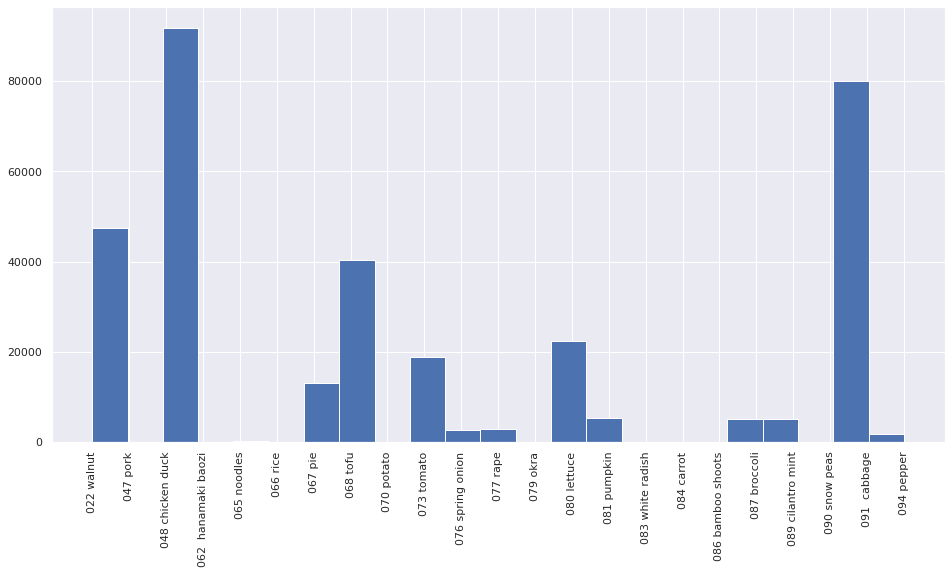

In [52]:
fichier='00000269.jpg'
train_images = sorted(glob("/home/jovyan/images"+os.sep+fichier))
prediction_mask = plot_predictions(train_images, colormap, model=model, n_classes=NUM_CLASSES)
d = initClasses(prediction_mask,donnees,fichier)

In [ ]:
fichier='00000269.jpg'
train_images = sorted(glob("/home/jovyan/images"+os.sep+fichier))
prediction_mask = plot_predictions(train_images, colormap, model=model, n_classes=NUM_CLASSES)
d = initClasses(prediction_mask,donnees,fichier)